In [42]:
import cv2
import numpy as np
import os
import math
from matplotlib import pyplot as plt
from IPython.display import display, clear_output
from skimage import data

In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
base_dir = "/content/drive/Shareddrives/Visión por Computador - Deep Thinking/Trabajo 2"
synthetic_dir = os.path.join(base_dir, "data/synthetic")
figures_dir = os.path.join(base_dir, "results/figures")

# Crear los directorios en Drive
for d in [synthetic_dir, figures_dir]:
    os.makedirs(d, exist_ok=True)

Creamos tres imágenes sintéticas

In [45]:
def create_checkerboard(w=600, h=400, sq=50):
    img = np.zeros((h,w), dtype=np.uint8)
    for y in range(0,h,sq):
        for x in range(0,w,sq):
            if ((x//sq) + (y//sq)) % 2 == 0:
                img[y:y+sq, x:x+sq] = 255
    return img

In [46]:
def create_text_image(text='SYN', w=600, h=400, font_scale=3, thickness=8):
    img = np.zeros((h,w), dtype=np.uint8)
    # Center text
    (tw, th), base = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
    x = (w - tw) // 2
    y = (h + th) // 2
    cv2.putText(img, text, (x,y), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255,), thickness)
    return img

In [47]:
def create_geometric_image(w=600, h=400):
    img = np.zeros((h,w), dtype=np.uint8)
    # draw random shapes
    # rectangle
    cv2.rectangle(img, (50,50), (200,200), (255,), -1)
    # circle
    cv2.circle(img, (400,100), 60, (255,), -1)
    # triangle
    pts = np.array([[300,300], [350,200], [400,300]], dtype=np.int32)
    cv2.fillPoly(img, [pts], (255,))
    # line
    cv2.line(img, (0,h-1), (w-1, 0), (255,), 4)
    return img

In [48]:
def apply_affine_transform(img, angle=30, scale=1.3, tx=70, ty=-30):
    h, w = img.shape[:2]
    center = (w/2, h/2)
    M = cv2.getRotationMatrix2D(center, angle, scale)
    M[0,2] += tx
    M[1,2] += ty
    transformed = cv2.warpAffine(img, M, (w,h))
    return transformed, M

## ***Detection and Matching***

A continuación implementamos una función que detecta puntos clave y empareja características entre dos imágenes.

In [49]:
def detect_and_match(img1, img2, detector_type='ORB', nfeatures=1000, ratio=0.75):
    """
    Detecta puntos clave y empareja características entre dos imágenes usando un detector
    de puntos clave especificado (ORB, SIFT o AKAZE). Retorna los keypoints detectados
    y los emparejamientos filtrados con el método de ratio test.

    Parámetros:
    - img1 (np.ndarray): Primera imagen en escala de grises.
    - img2 (np.ndarray): Segunda imagen en escala de grises (transformada).
    - detector_type (str): Tipo de detector y descriptor a utilizar. Default: 'ORB'.
                           Opciones: 'ORB', 'SIFT', 'AKAZE'.
    - nfeatures (int): Número máximo de características a detectar (aplica a ORB y SIFT).
                       Default: 1000.
    - ratio (float): Umbral del test de razón de Lowe para filtrar emparejamientos.
                     Default: 0.75.

    Retorna:
    - kp1 (list): Lista de keypoints detectados en la primera imagen.
    - kp2 (list): Lista de keypoints detectados en la segunda imagen.
    - good (list): Lista de emparejamientos "buenos" (coincidencias filtradas por ratio test).
    """

    detector_type = detector_type.upper()

    if detector_type == 'ORB':
        detector = cv2.ORB_create(nfeatures=nfeatures)
        norm = cv2.NORM_HAMMING
    elif detector_type == 'SIFT':
        detector = cv2.SIFT_create(nfeatures=nfeatures)
        norm = cv2.NORM_L2
    elif detector_type == 'AKAZE':
        detector = cv2.AKAZE_create()
        norm = cv2.NORM_HAMMING
    else:
        raise ValueError(f'Detector desconocido: {detector_type}')

    kp1, des1 = detector.detectAndCompute(img1, None)
    kp2, des2 = detector.detectAndCompute(img2, None)

    if des1 is None or des2 is None:
        return kp1, kp2, []

    bf = cv2.BFMatcher(norm, crossCheck=False)
    matches = bf.knnMatch(des1, des2, k=2)
    good = [m for m, n in matches if m.distance < ratio * n.distance]

    return kp1, kp2, good

In [50]:

def estimate_homography_and_metrics(kp1, kp2, matches, H_gt=None, ransac_thresh=4.0):
    """
    Estima la homografía (matriz 3x3) entre dos conjuntos de keypoints y calcula métricas de registro.
    Se usa RANSAC para filtrar outliers entre los emparejamientos.

    Parámetros:
    - kp1, kp2: Listas de keypoints de las dos imágenes.
    - matches: Lista de emparejamientos (DMatch) entre kp1 y kp2.
    - H_gt: Matriz de homografía ground truth (opcional, para pruebas con imágenes sintéticas).
    - ransac_thresh: Umbral de reproyección para RANSAC (por defecto=4.0).

    Retorna:
    - H_est: Matriz de homografía estimada.
    - inliers: Máscara binaria indicando cuáles matches son inliers.
    - metrics: Diccionario con métricas evaluadas.
    - corrected_matches: Lista de matches que fueron considerados inliers.
    """
    if len(matches) < 4:
        return None, None, None, None

    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H_est, inliers = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransac_thresh)
    if H_est is None:
        return None, None, None, None

    inliers = inliers.ravel().astype(bool)
    corrected_matches = [m for m, inl in zip(matches, inliers) if inl]

    metrics = {
        "num_matches": len(matches),
        "num_inliers": np.sum(inliers),
        "inlier_ratio": np.sum(inliers) / len(matches)
    }

    pts1_h = cv2.convertPointsToHomogeneous(pts1[inliers]).reshape(-1, 3)
    proj = (H_est @ pts1_h.T).T
    proj /= proj[:, 2:3]
    proj = proj[:, :2]

    error = np.linalg.norm(proj - pts2[inliers].reshape(-1, 2), axis=1)
    metrics["rmse_reprojection"] = np.sqrt(np.mean(np.square(error)))

    if H_gt is not None:
        H_gt /= H_gt[2, 2]
        H_est /= H_est[2, 2]
        diff = np.linalg.norm(H_gt - H_est)
        metrics["homography_error"] = diff

        angle_diff = np.degrees(np.arccos(np.clip((np.trace(H_gt[:2, :2].T @ H_est[:2, :2]) - 1) / 2, -1.0, 1.0)))
        metrics["angular_error_deg"] = angle_diff

    return H_est, inliers, metrics, corrected_matches

In [51]:
def draw_matches_color(img1, kp1, img2, kp2, matches, filename='matches.png'):
    match_img = cv2.drawMatches(img1, kp1, img2, kp2, matches, None,
                                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    cv2.imwrite(filename, match_img)
    return filename

In [52]:
def warp_and_stitch_blend(img1, img2, H, blend_width=50):
    # Dimensiones de ambas imágenes
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # Crear una lista de puntos de las esquinas de img2 transformadas por H
    corners_img2 = np.array([
        [0, 0],
        [0, h2],
        [w2, h2],
        [w2, 0]
    ], dtype=np.float32).reshape(-1, 1, 2)

    transformed_corners = cv2.perspectiveTransform(corners_img2, H)

    # Combinar estas esquinas con las de img1
    corners_combined = np.concatenate((transformed_corners,
                                       np.array([[0, 0], [0, h1], [w1, h1], [w1, 0]], dtype=np.float32).reshape(-1, 1, 2)), axis=0)

    # Calcular los límites del canvas
    [x_min, y_min] = np.int32(corners_combined.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(corners_combined.max(axis=0).ravel() + 0.5)
    translation = [-x_min, -y_min]

    # Crear el canvas y aplicar la transformación a img2
    stitched_img = np.zeros((y_max - y_min, x_max - x_min), dtype=np.float32)
    mask1 = np.zeros_like(stitched_img, dtype=np.float32)
    mask2 = np.zeros_like(stitched_img, dtype=np.float32)

    # Pegar img1 en el canvas
    stitched_img[translation[1]: translation[1] + h1, translation[0]: translation[0] + w1] = img1
    mask1[translation[1]: translation[1] + h1, translation[0]: translation[0] + w1] = 1.0

    # Transformar img2
    warped_img2 = cv2.warpPerspective(img2, H, (x_max - x_min, y_max - y_min))
    warped_mask2 = cv2.warpPerspective(np.ones_like(img2, dtype=np.float32), H, (x_max - x_min, y_max - y_min))

    # Blending suave mediante máscaras y diferencia de bordes
    overlap = (mask1 > 0) & (warped_mask2 > 0)
    distance1 = cv2.distanceTransform((mask1 == 0).astype(np.uint8), cv2.DIST_L2, 5)
    distance2 = cv2.distanceTransform((warped_mask2 == 0).astype(np.uint8), cv2.DIST_L2, 5)

    alpha = distance1 / (distance1 + distance2 + 1e-8)
    stitched_img = np.where(overlap, alpha * stitched_img + (1 - alpha) * warped_img2, stitched_img + warped_img2)

    return stitched_img.astype(np.uint8)

In [53]:
def process_image_with_detectors(img, name, synthetic_dir, figures_dir, transform_params, H_gt=None):
    # Aplicar transformación sintética a la imagen
    transformed, H_applied = apply_affine_transform(
        img,
        angle=transform_params['angle'],
        scale=transform_params['scale'],
        tx=transform_params['tx'],
        ty=transform_params['ty']
    )

    # Usar la H_gt pasada si se dio, sino la generada por apply_affine_transform
    if H_gt is None:
        H_gt = np.vstack([H_applied, [0, 0, 1]])

    # Guardar las imágenes
    fname_base = os.path.join(synthetic_dir, f'{name}_base.png')
    fname_transformed = os.path.join(synthetic_dir, f'{name}_transformed.png')
    cv2.imwrite(fname_base, img)
    cv2.imwrite(fname_transformed, transformed)

    print(f"\n--- Análisis de imagen: {name.upper()} ---")
    print("1) Imagen base:")
    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    print("2) Imagen transformada:")
    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(transformed, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    result_per_detector = {}

    for i, detector in enumerate(['ORB', 'SIFT', 'AKAZE'], 1):
        print(f"\n   [{i}] Detector: {detector}")

        kp1, kp2, good = detect_and_match(img, transformed, detector_type=detector)
        H_est, inliers, metrics, corrected_matches = estimate_homography_and_metrics(kp1, kp2, good, H_gt=H_gt)

        # Add a check here
        if corrected_matches is not None and len(corrected_matches) > 0:
            match_img_path = os.path.join(figures_dir, f'{name}_{detector}_matches.png')
            draw_matches_color(img, kp1, transformed, kp2, corrected_matches[:50], filename=match_img_path)

            match_img = cv2.imread(match_img_path)
            plt.figure(figsize=(12, 8))
            plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
            plt.title(f"Corrected Matches usando {detector}")
            plt.axis('off')
            plt.show()
        else:
            print(f"No corrected matches found for {detector}.")


        if H_est is not None:
            stitched_img = warp_and_stitch_blend(img, transformed, H_est)
            if stitched_img is not None:
                plt.figure(figsize=(14, 8))
                plt.imshow(cv2.cvtColor(stitched_img, cv2.COLOR_BGR2RGB))
                plt.title(f"Stitched usando {detector}")
                plt.axis('off')
                plt.show()
            else:
                print("Stitching failed: H_est is None or invalid")
        else:
            print("Homography estimation failed.")


        print(f"Keypoints detectados: {len(kp1)} en base, {len(kp2)} en transformada")
        print(f"Matches totales: {len(good)}, Corrected matches: {len(corrected_matches) if corrected_matches is not None else 0}")
        print("Métricas de registro:")
        if metrics:
            for metric_name, metric_value in metrics.items():
                print(f" - {metric_name}: {metric_value:.4f}")
        else:
            print("Metrics could not be computed.")

        result_per_detector[detector] = {
            'num_keypoints': (len(kp1), len(kp2)),
            'num_matches': len(good),
            'num_corrected_matches': len(corrected_matches) if corrected_matches is not None else 0,
            'metrics': metrics,
            'H_gt': H_gt,
            'H_est': H_est
        }

    return result_per_detector

In [54]:
def compute_transformation_matrix(angle, scale, tx, ty, img_shape):
    """
    Compute a 3x3 homography matrix that applies rotation, scaling, and translation.
    """
    h, w = img_shape[:2]
    center = (w / 2, h / 2)

    # Rotation + Scaling matrix (2x3)
    M = cv2.getRotationMatrix2D(center, angle, scale)

    # Add translation
    M[0, 2] += tx
    M[1, 2] += ty

    # Convert to full 3x3
    H = np.vstack([M, [0, 0, 1]])
    return H


--- Análisis de imagen: LENA ---
1) Imagen base:


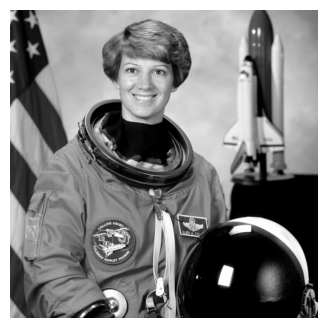

2) Imagen transformada:


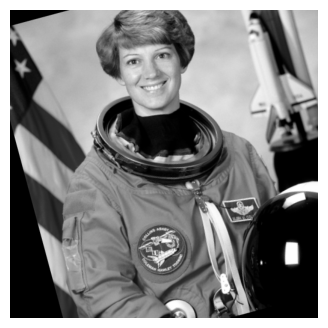


   [1] Detector: ORB


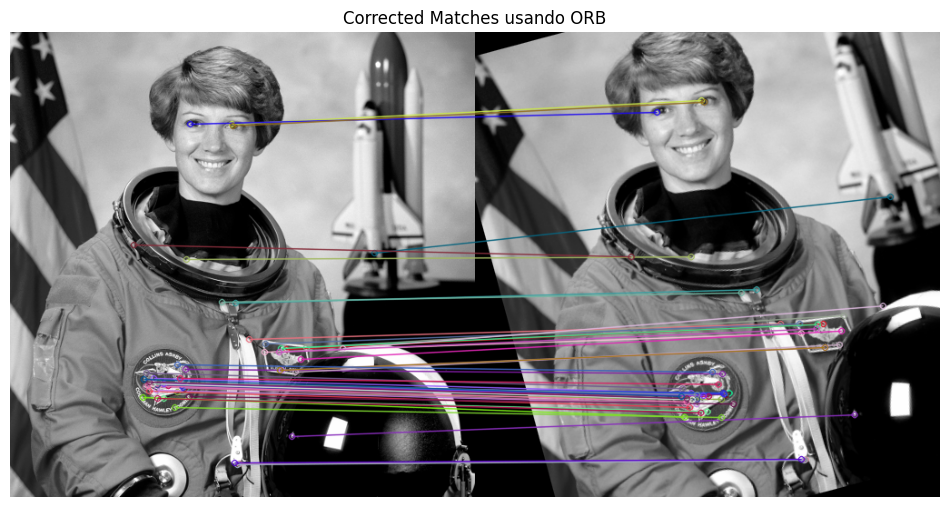

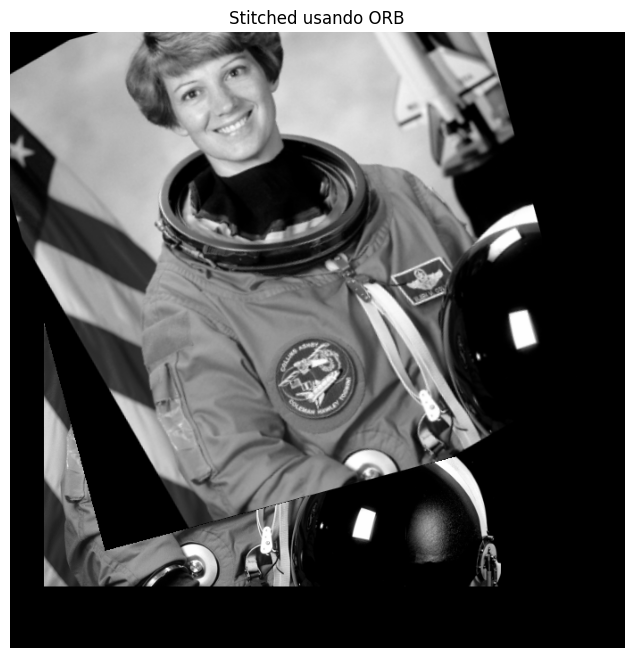

Keypoints detectados: 1000 en base, 1000 en transformada
Matches totales: 352, Corrected matches: 335
Métricas de registro:
 - num_matches: 352.0000
 - num_inliers: 335.0000
 - inlier_ratio: 0.9517
 - rmse_reprojection: 1.4938
 - homography_error: 0.7084
 - angular_error_deg: 44.9191

   [2] Detector: SIFT


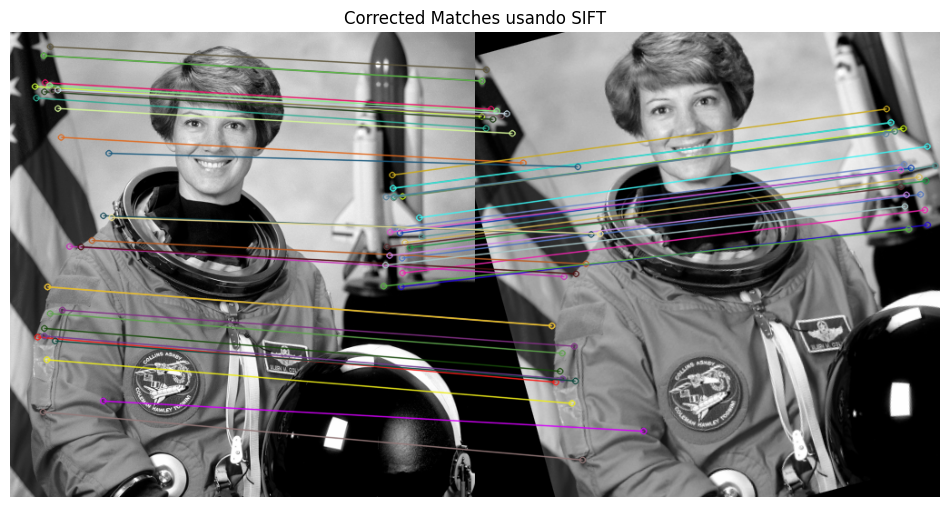

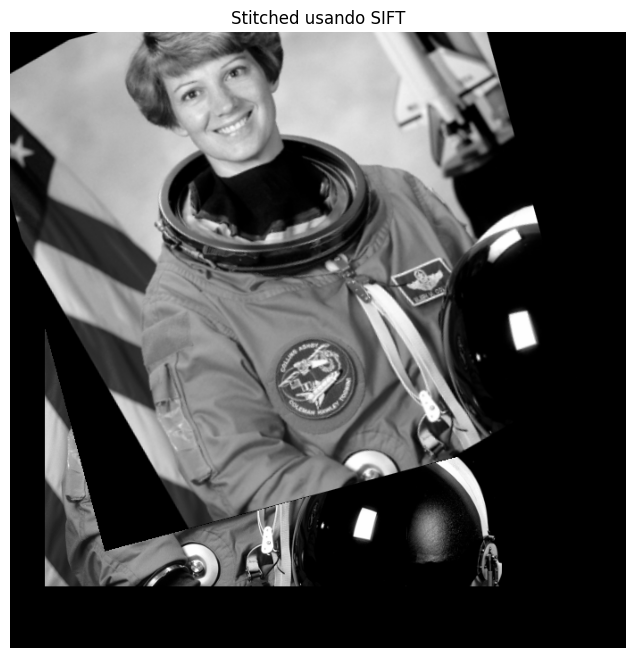

Keypoints detectados: 1000 en base, 1000 en transformada
Matches totales: 575, Corrected matches: 557
Métricas de registro:
 - num_matches: 575.0000
 - num_inliers: 557.0000
 - inlier_ratio: 0.9687
 - rmse_reprojection: 0.4418
 - homography_error: 0.1358
 - angular_error_deg: 44.7272

   [3] Detector: AKAZE


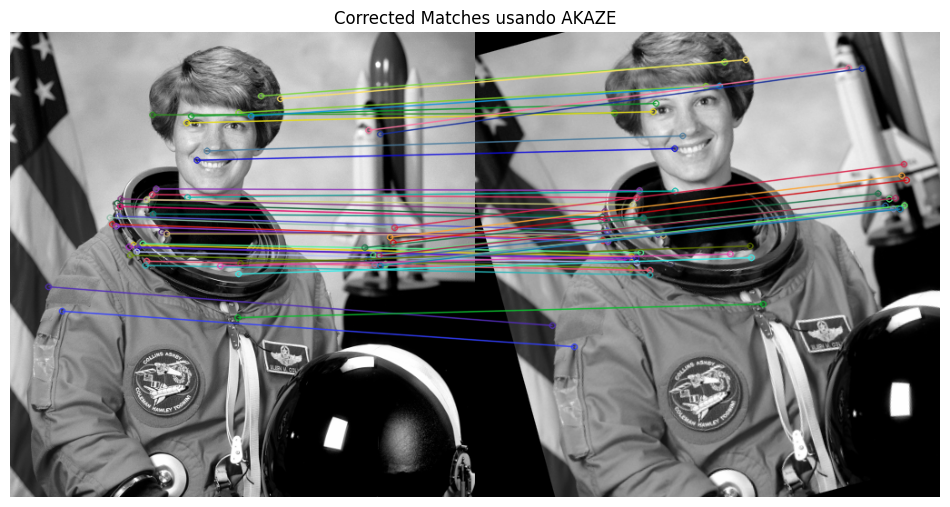

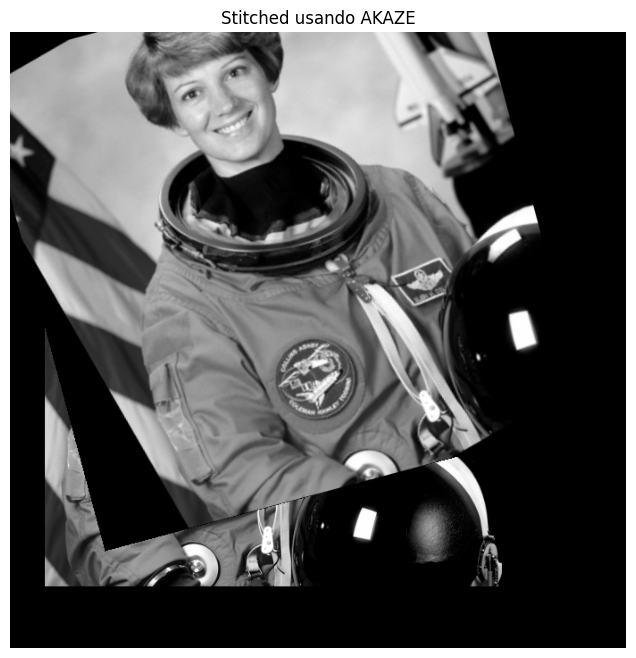

Keypoints detectados: 870 en base, 780 en transformada
Matches totales: 535, Corrected matches: 524
Métricas de registro:
 - num_matches: 535.0000
 - num_inliers: 524.0000
 - inlier_ratio: 0.9794
 - rmse_reprojection: 0.8853
 - homography_error: 0.1954
 - angular_error_deg: 44.6410


In [55]:
# Cargar la imagen y convertir a escala de grises
lena = data.astronaut()
lena_gray = cv2.cvtColor(lena, cv2.COLOR_RGB2GRAY)

# Parámetros de transformación para la imagen 'lena'
transform_params_lena = {
    'angle': 15,
    'scale': 1.1,
    'tx': 50,
    'ty': -20
}

# Crear matriz de transformación homográfica a partir de los parámetros
H_gt_lena = compute_transformation_matrix(
    transform_params_lena['angle'],
    transform_params_lena['scale'],
    transform_params_lena['tx'],
    transform_params_lena['ty'],
    lena_gray.shape
)

# Llamada corregida a la función principal con H_gt
resultados_lena = process_image_with_detectors(
    lena_gray,
    'lena',
    synthetic_dir,
    figures_dir,
    transform_params_lena,
    H_gt=H_gt_lena  # <-- Se pasa la matriz de homografía
)


--- Análisis de imagen: LENA ---
1) Imagen base:


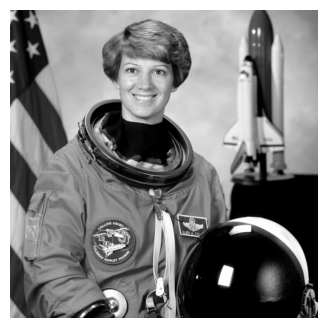

2) Imagen transformada:


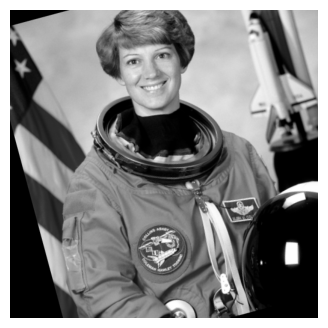


   [1] Detector: ORB


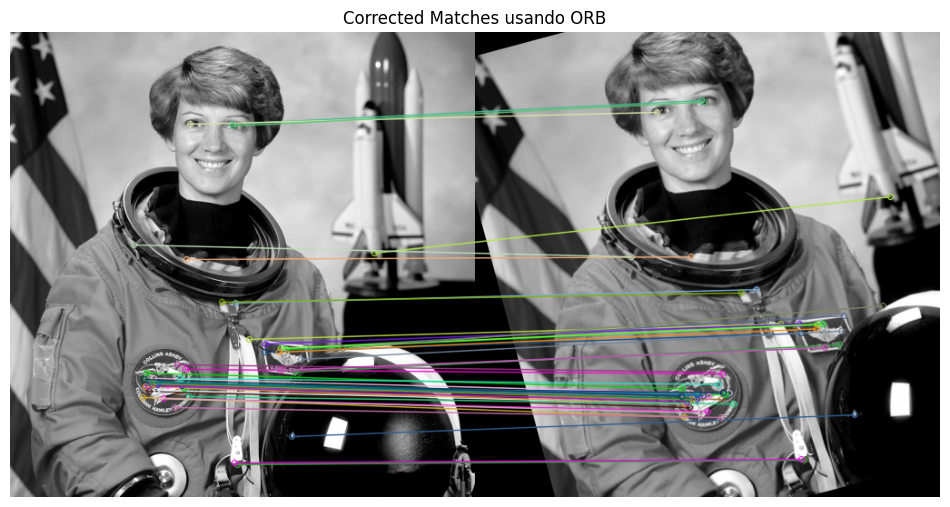

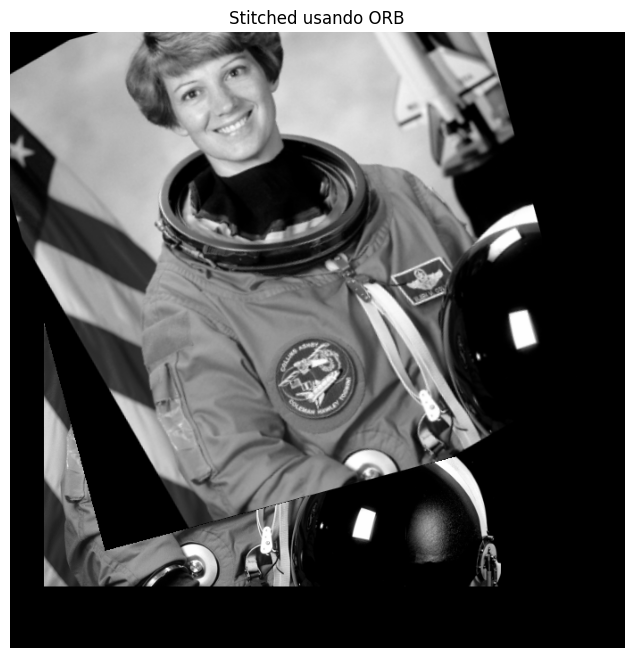

Keypoints detectados: 1000 en base, 1000 en transformada
Matches totales: 352, Corrected matches: 335
Métricas de registro:
 - num_matches: 352.0000
 - num_inliers: 335.0000
 - inlier_ratio: 0.9517
 - rmse_reprojection: 1.4938
 - homography_error: 0.7084
 - angular_error_deg: 44.9191

   [2] Detector: SIFT


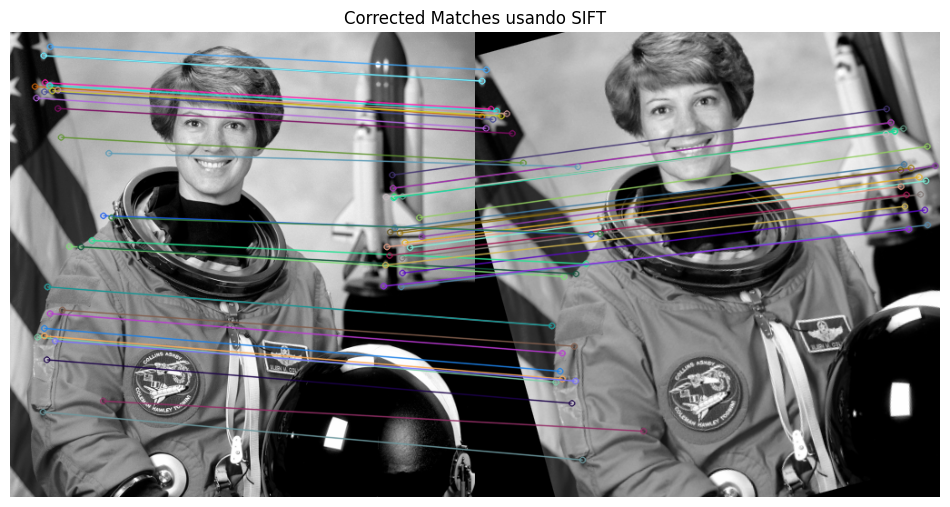

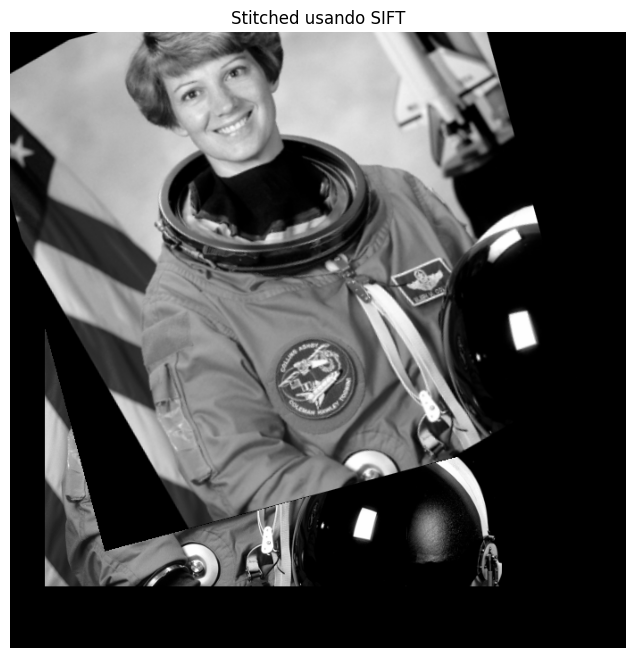

Keypoints detectados: 1000 en base, 1000 en transformada
Matches totales: 575, Corrected matches: 557
Métricas de registro:
 - num_matches: 575.0000
 - num_inliers: 557.0000
 - inlier_ratio: 0.9687
 - rmse_reprojection: 0.4418
 - homography_error: 0.1358
 - angular_error_deg: 44.7272

   [3] Detector: AKAZE


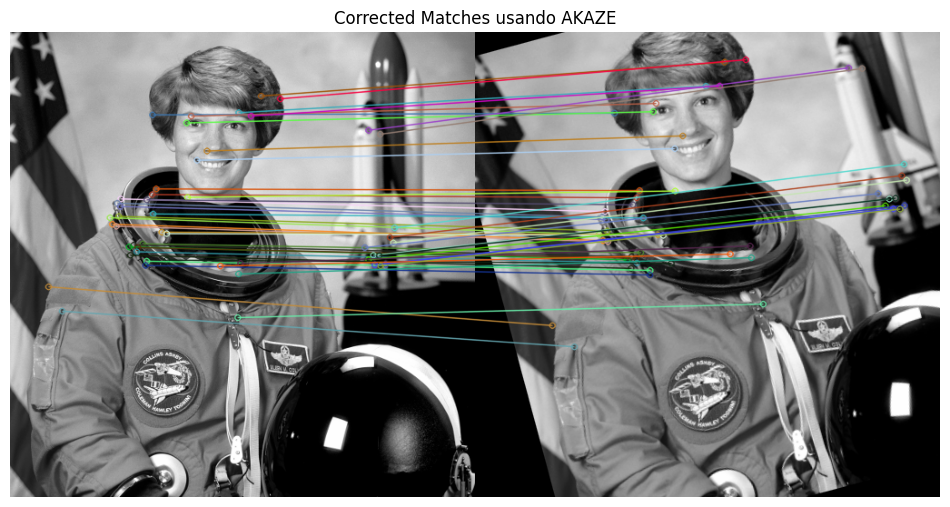

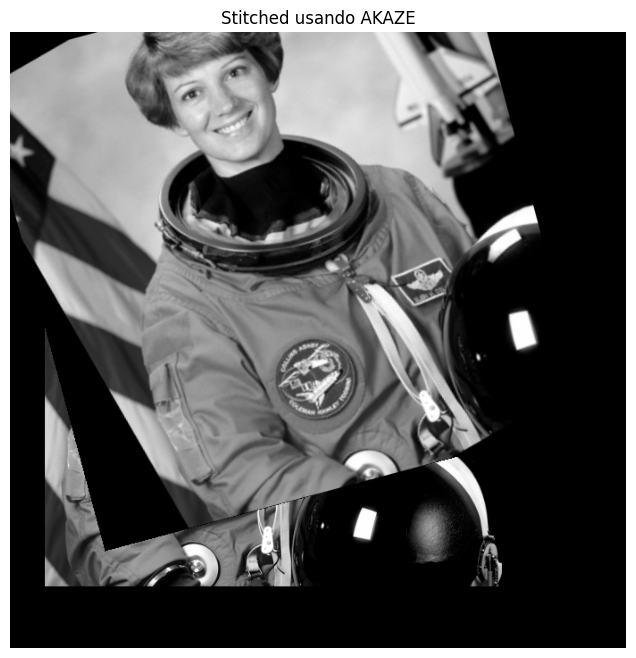

Keypoints detectados: 870 en base, 780 en transformada
Matches totales: 535, Corrected matches: 524
Métricas de registro:
 - num_matches: 535.0000
 - num_inliers: 524.0000
 - inlier_ratio: 0.9794
 - rmse_reprojection: 0.8853
 - homography_error: 0.1954
 - angular_error_deg: 44.6410


In [56]:
resultados_lena = process_image_with_detectors(
    lena_gray,
    'lena',
    synthetic_dir,
    figures_dir,
    transform_params_lena,
    H_gt=H_gt_lena
)

###########################################################

In [57]:
transform_params = {
    'angle': 30,
    'scale': 1.3,
    'tx': 70,
    'ty': -30
}


--- Análisis de imagen: CHECKER ---
1) Imagen base:


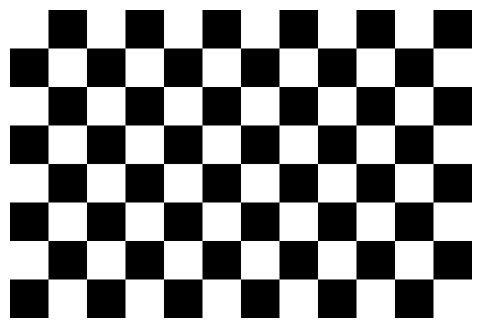

2) Imagen transformada:


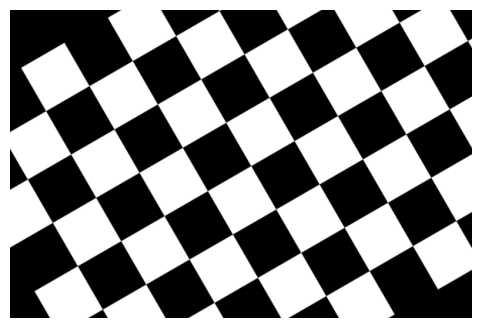


   [1] Detector: ORB


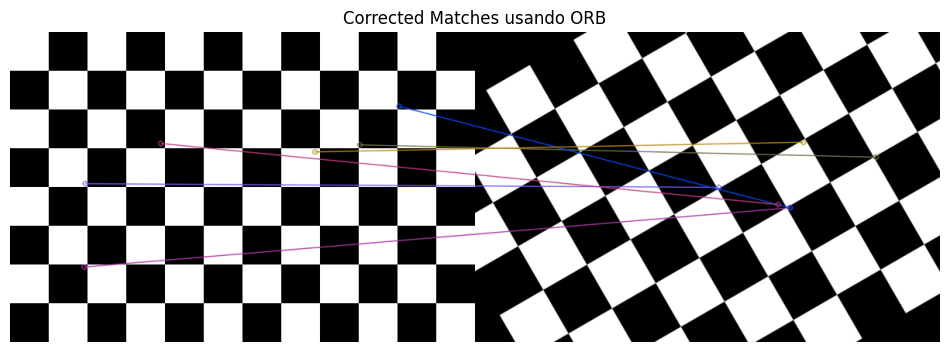

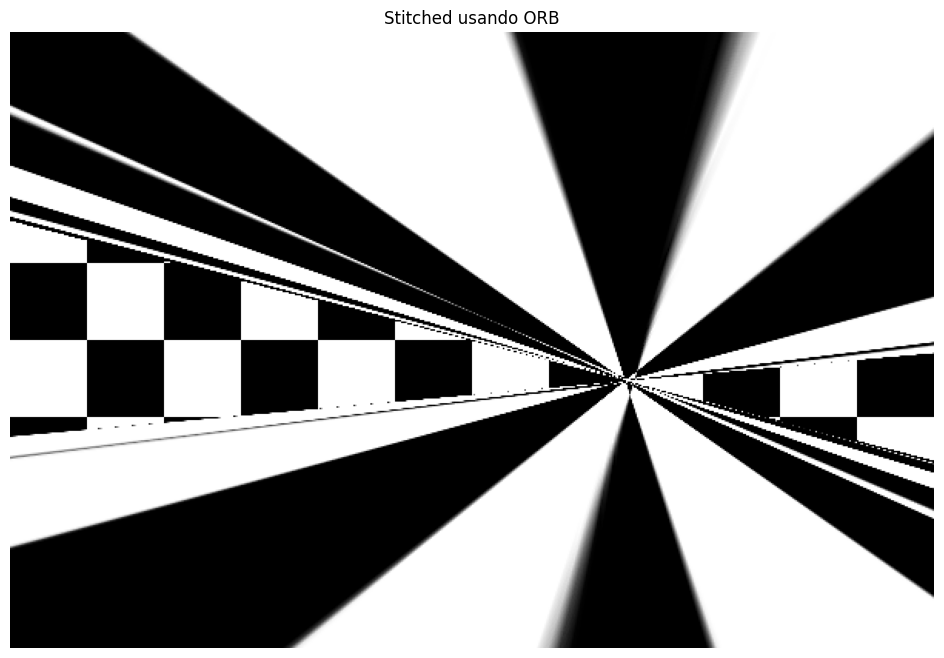

Keypoints detectados: 530 en base, 922 en transformada
Matches totales: 20, Corrected matches: 6
Métricas de registro:
 - num_matches: 20.0000
 - num_inliers: 6.0000
 - inlier_ratio: 0.3000
 - rmse_reprojection: 1.1028
 - homography_error: 501.7537
 - angular_error_deg: 180.0000

   [2] Detector: SIFT
No corrected matches found for SIFT.
Homography estimation failed.
Keypoints detectados: 531 en base, 284 en transformada
Matches totales: 6, Corrected matches: 0
Métricas de registro:
Metrics could not be computed.

   [3] Detector: AKAZE


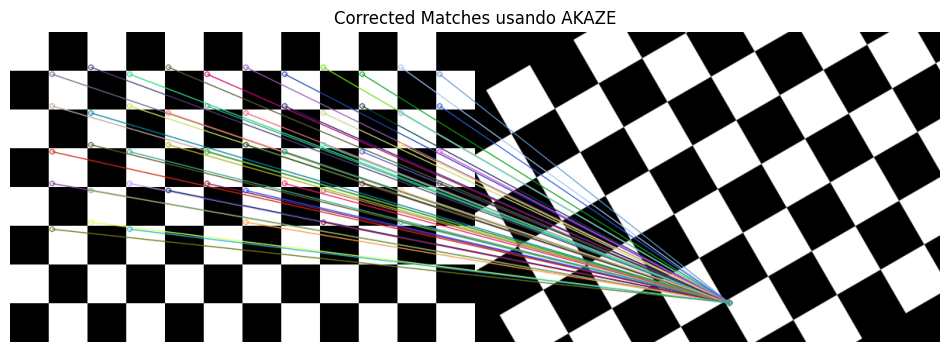

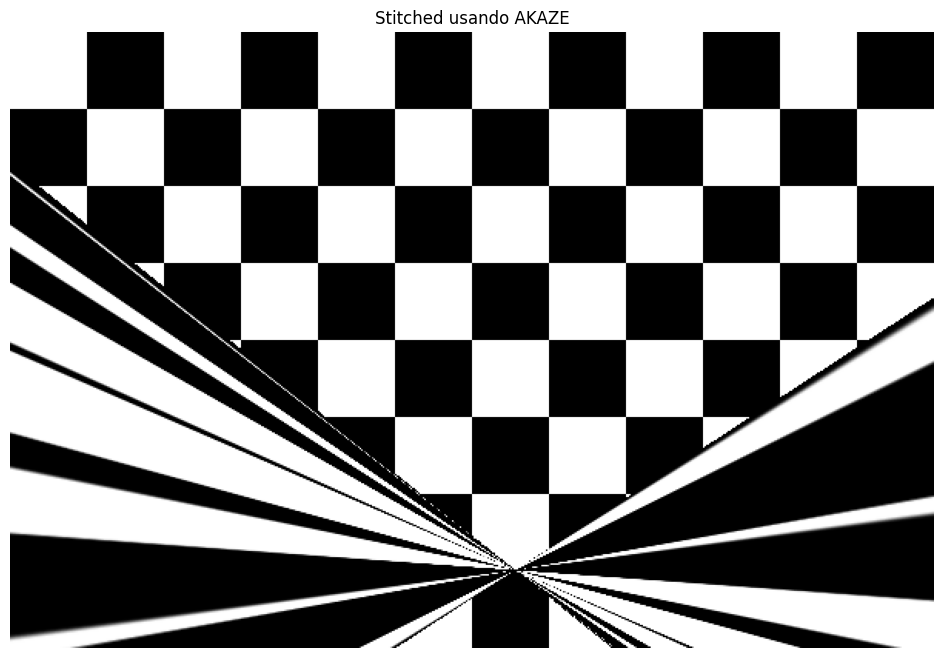

Keypoints detectados: 829 en base, 473 en transformada
Matches totales: 167, Corrected matches: 75
Métricas de registro:
 - num_matches: 167.0000
 - num_inliers: 75.0000
 - inlier_ratio: 0.4491
 - rmse_reprojection: 0.3323
 - homography_error: 474.0435
 - angular_error_deg: 180.0000


In [58]:
checker_image = create_checkerboard()

# Procesar
results_checker = process_image_with_detectors(
    img=checker_image,
    name='checker',
    synthetic_dir=synthetic_dir,
    figures_dir=figures_dir,
    transform_params=transform_params
)


--- Análisis de imagen: TEXT ---
1) Imagen base:


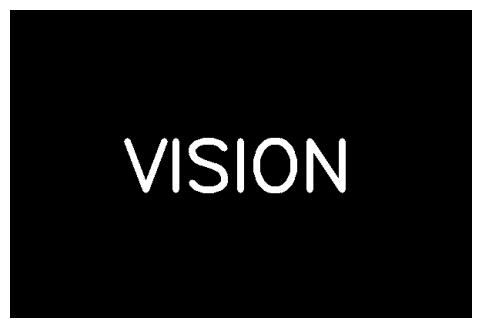

2) Imagen transformada:


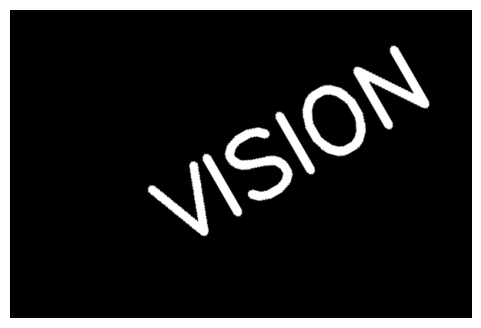


   [1] Detector: ORB


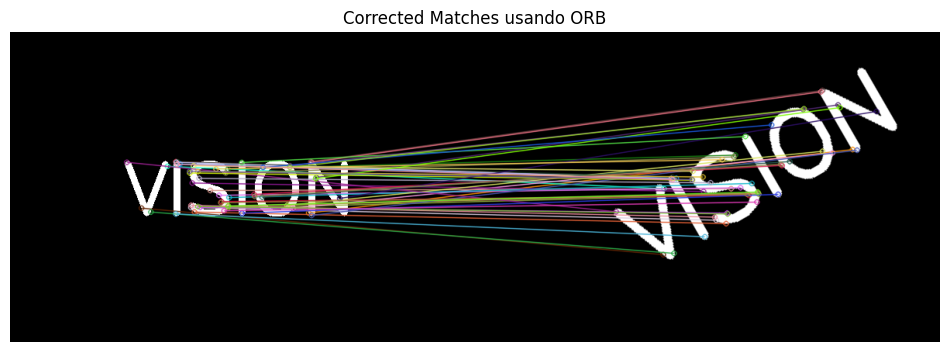

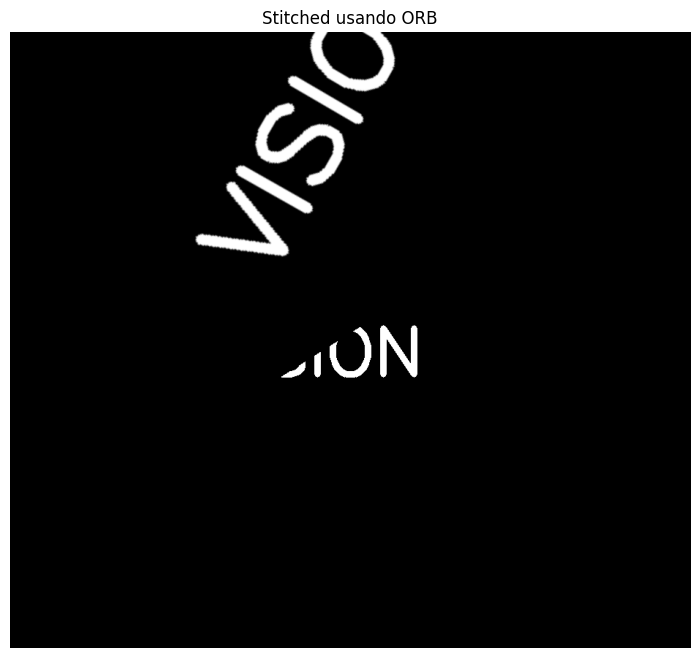

Keypoints detectados: 695 en base, 888 en transformada
Matches totales: 135, Corrected matches: 56
Métricas de registro:
 - num_matches: 135.0000
 - num_inliers: 56.0000
 - inlier_ratio: 0.4148
 - rmse_reprojection: 2.3259
 - homography_error: 23.0729
 - angular_error_deg: 0.0000

   [2] Detector: SIFT


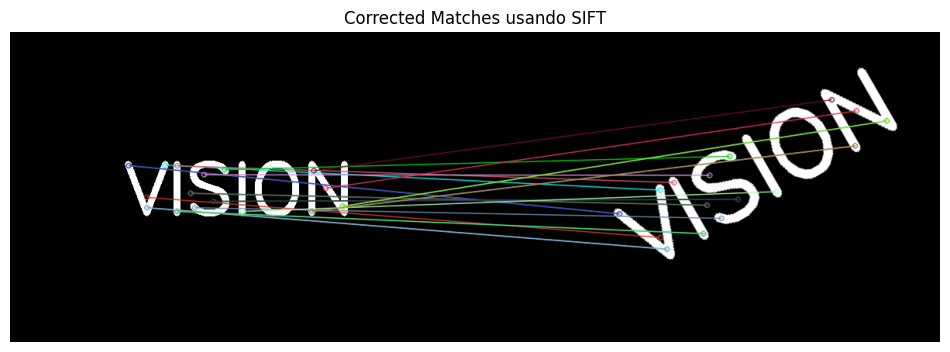

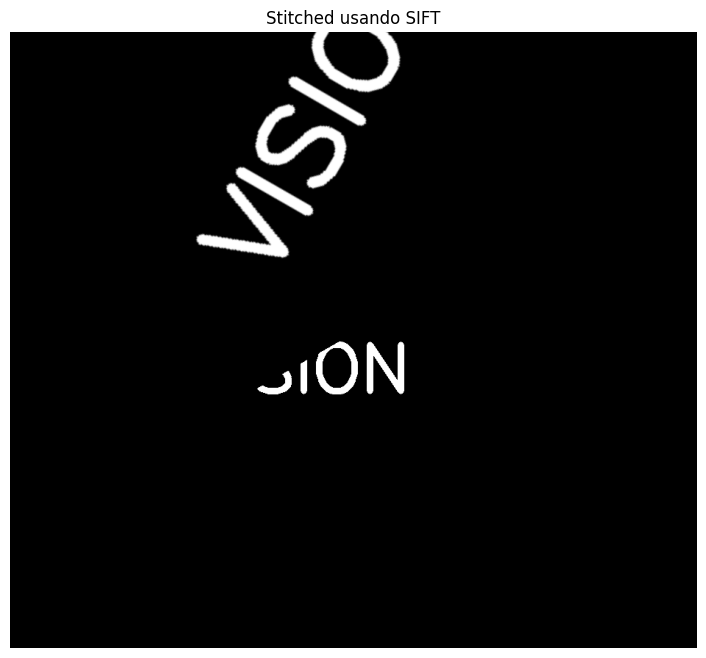

Keypoints detectados: 45 en base, 132 en transformada
Matches totales: 24, Corrected matches: 23
Métricas de registro:
 - num_matches: 24.0000
 - num_inliers: 23.0000
 - inlier_ratio: 0.9583
 - rmse_reprojection: 0.4415
 - homography_error: 2.3546
 - angular_error_deg: 0.0000

   [3] Detector: AKAZE


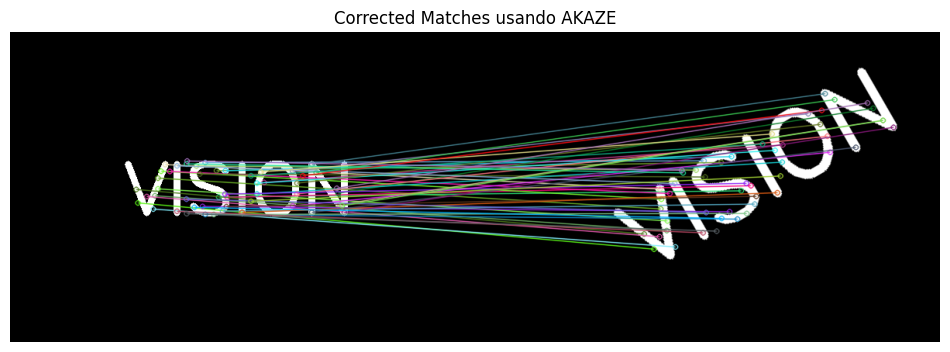

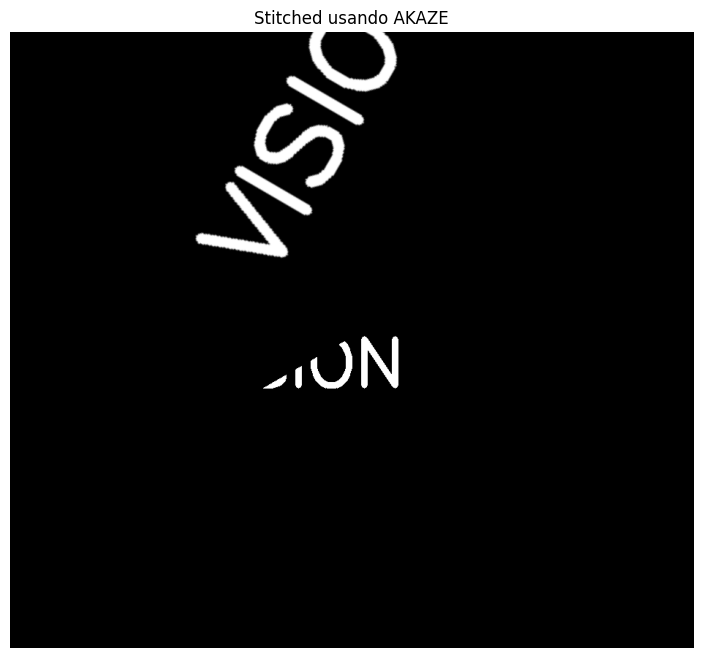

Keypoints detectados: 247 en base, 301 en transformada
Matches totales: 84, Corrected matches: 60
Métricas de registro:
 - num_matches: 84.0000
 - num_inliers: 60.0000
 - inlier_ratio: 0.7143
 - rmse_reprojection: 1.3866
 - homography_error: 3.5133
 - angular_error_deg: 0.0000


In [59]:
# Generar imagen con texto
text_image = create_text_image('VISION')

# Procesar
results_text = process_image_with_detectors(
    img=text_image,
    name='text',
    synthetic_dir=synthetic_dir,
    figures_dir=figures_dir,
    transform_params=transform_params
)


--- Análisis de imagen: GEO ---
1) Imagen base:


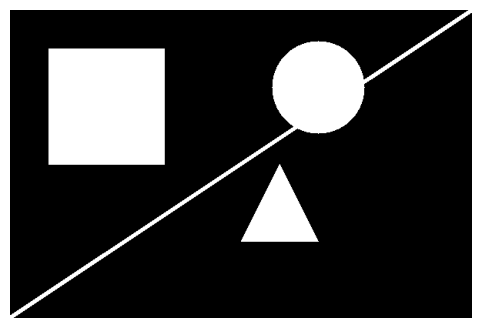

2) Imagen transformada:


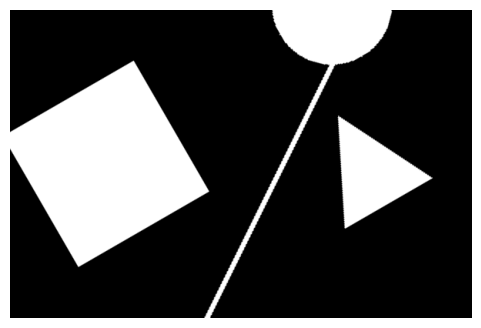


   [1] Detector: ORB


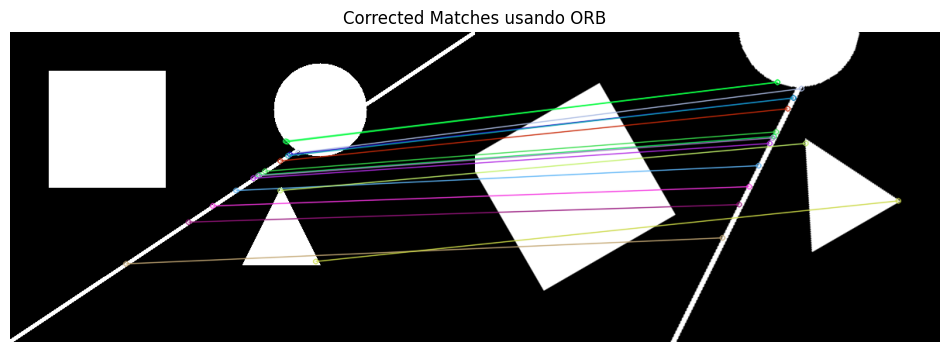

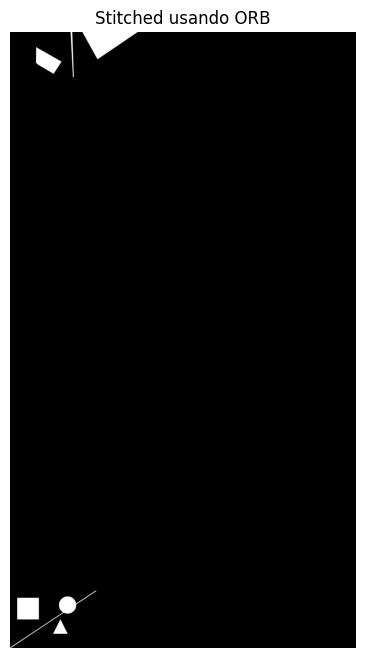

Keypoints detectados: 275 en base, 368 en transformada
Matches totales: 49, Corrected matches: 16
Métricas de registro:
 - num_matches: 49.0000
 - num_inliers: 16.0000
 - inlier_ratio: 0.3265
 - rmse_reprojection: 2.3859
 - homography_error: 183.8548
 - angular_error_deg: 67.3956

   [2] Detector: SIFT


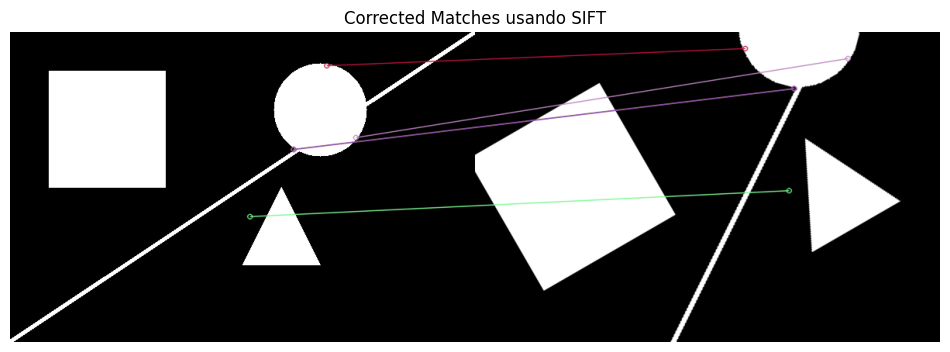

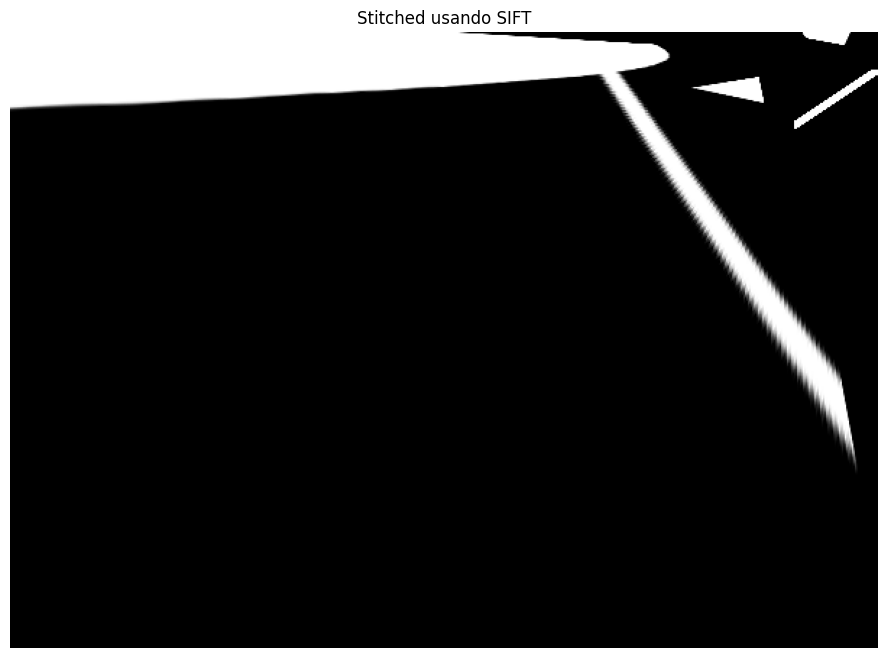

Keypoints detectados: 31 en base, 167 en transformada
Matches totales: 8, Corrected matches: 5
Métricas de registro:
 - num_matches: 8.0000
 - num_inliers: 5.0000
 - inlier_ratio: 0.6250
 - rmse_reprojection: 0.0000
 - homography_error: 669.1529
 - angular_error_deg: 180.0000

   [3] Detector: AKAZE


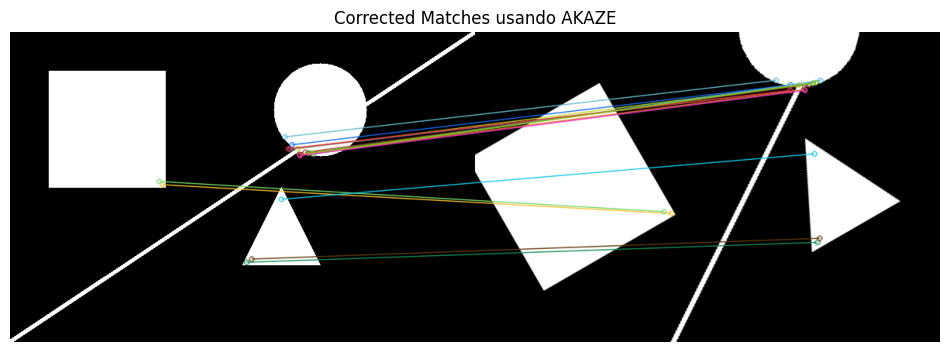

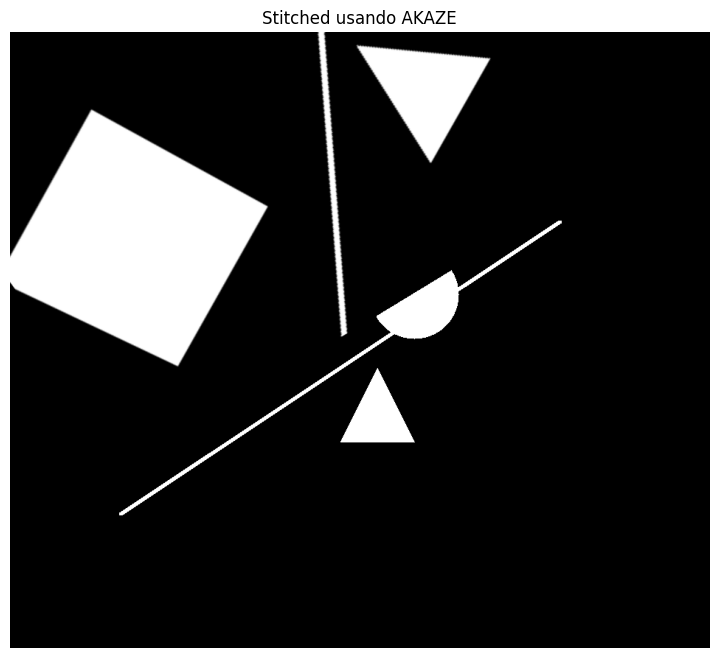

Keypoints detectados: 112 en base, 57 en transformada
Matches totales: 36, Corrected matches: 16
Métricas de registro:
 - num_matches: 36.0000
 - num_inliers: 16.0000
 - inlier_ratio: 0.4444
 - rmse_reprojection: 1.5581
 - homography_error: 50.4050
 - angular_error_deg: 0.0000


In [60]:
geo_image = create_geometric_image()

# Procesar
results_geo = process_image_with_detectors(
    img=geo_image,
    name='geo',
    synthetic_dir=synthetic_dir,
    figures_dir=figures_dir,
    transform_params=transform_params
)


--- Análisis de imagen: CAMERAMAN ---
1) Imagen base:


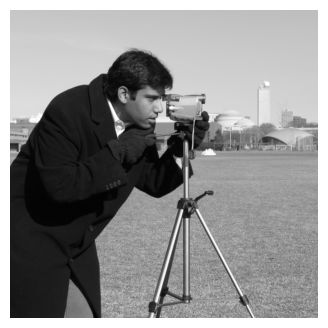

2) Imagen transformada:


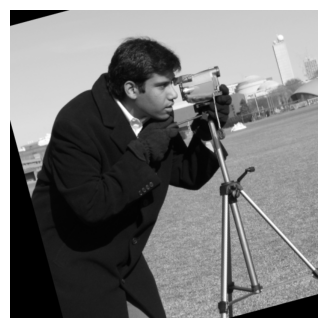


   [1] Detector: ORB


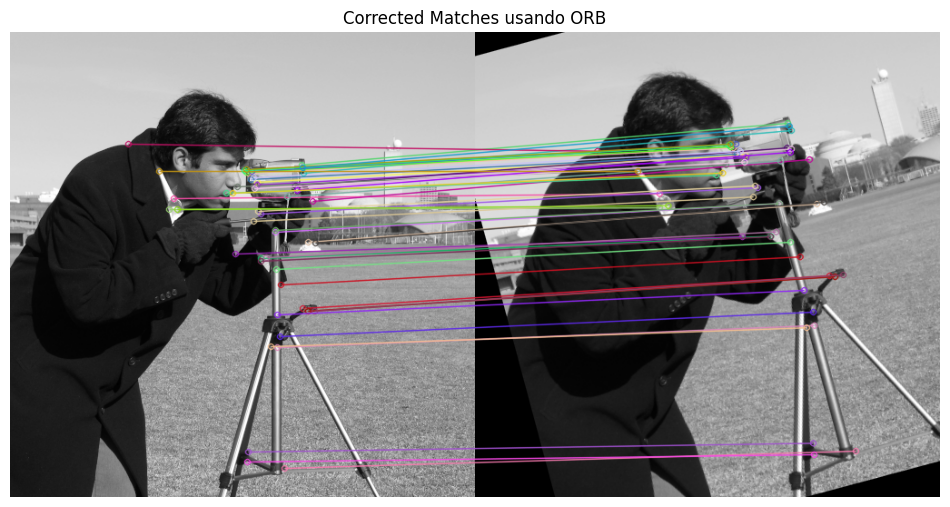

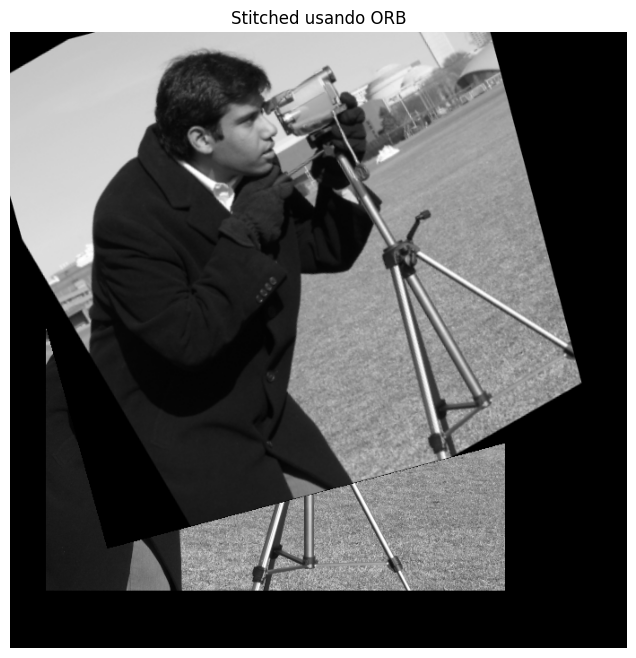

Keypoints detectados: 1000 en base, 1000 en transformada
Matches totales: 430, Corrected matches: 420
Métricas de registro:
 - num_matches: 430.0000
 - num_inliers: 420.0000
 - inlier_ratio: 0.9767
 - rmse_reprojection: 1.6108
 - homography_error: 1.4226
 - angular_error_deg: 44.2059

   [2] Detector: SIFT


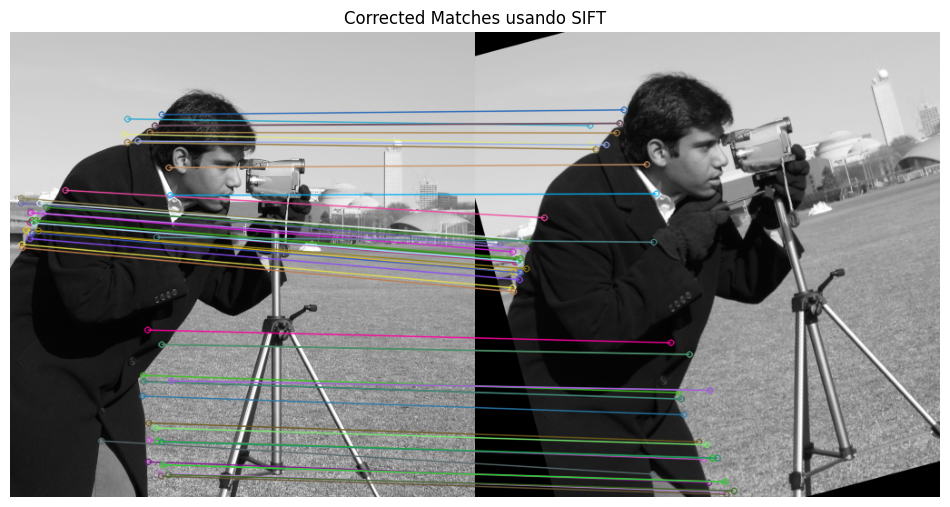

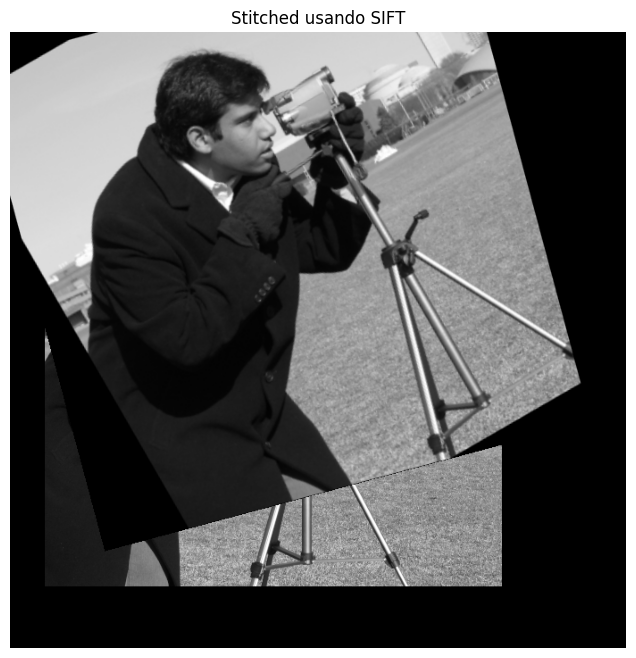

Keypoints detectados: 791 en base, 942 en transformada
Matches totales: 419, Corrected matches: 406
Métricas de registro:
 - num_matches: 419.0000
 - num_inliers: 406.0000
 - inlier_ratio: 0.9690
 - rmse_reprojection: 0.4367
 - homography_error: 0.0878
 - angular_error_deg: 44.7672

   [3] Detector: AKAZE


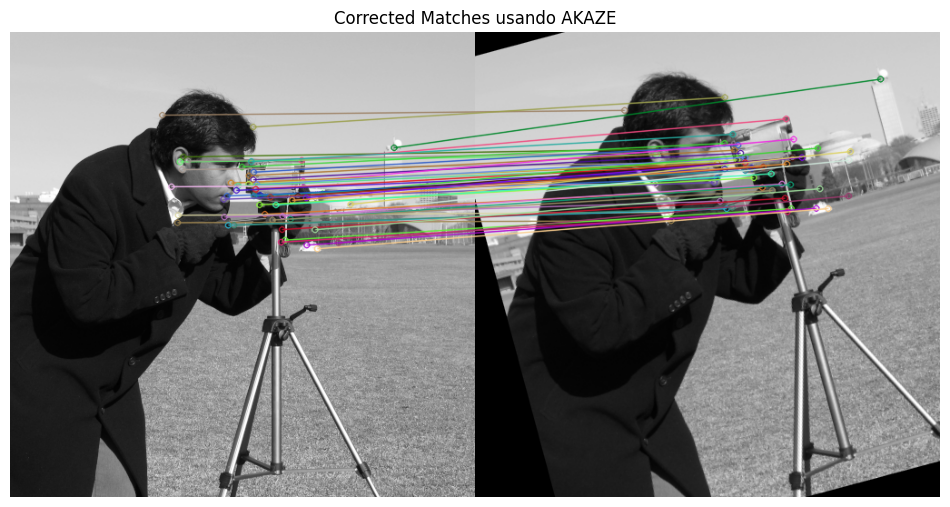

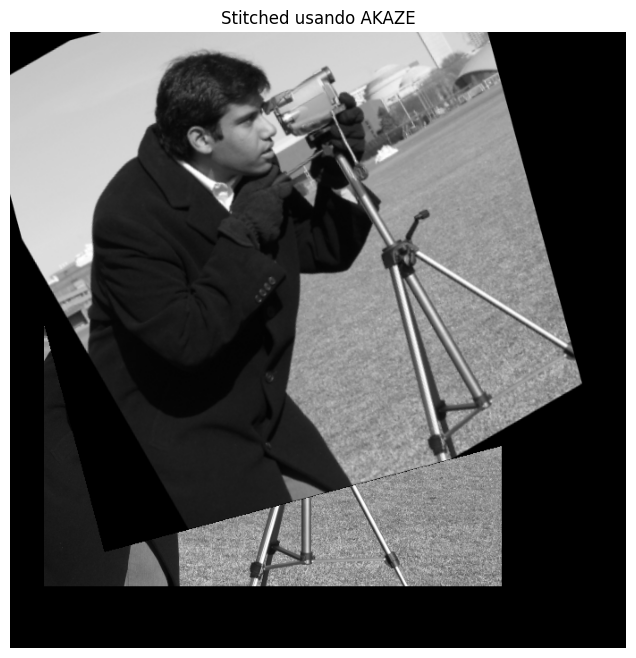

Keypoints detectados: 508 en base, 525 en transformada
Matches totales: 358, Corrected matches: 354
Métricas de registro:
 - num_matches: 358.0000
 - num_inliers: 354.0000
 - inlier_ratio: 0.9888
 - rmse_reprojection: 0.9602
 - homography_error: 1.2015
 - angular_error_deg: 45.1547


In [61]:
cameraman = data.camera()
cameraman_gray = cameraman.astype('uint8')

# Parámetros de transformación para Cameraman
transform_params_cameraman = {
    'angle': 15,
    'scale': 1.1,
    'tx': 50,
    'ty': -20
}

# Procesar imagen con los detectores ORB, SIFT, y AKAZE
results_cameraman = process_image_with_detectors(
    img=cameraman_gray,
    name='cameraman',
    synthetic_dir=synthetic_dir,
    figures_dir=figures_dir,
    transform_params=transform_params_cameraman
)